In [ ]:
!pip install tslearn
!pip install ta
!pip install tensorflow
!pip install hmmlearn
!pip install optuna
!pip install fastdtw

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.4/374.4 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for ta: filename=ta-0.11.0-py3-none-any.whl size=29412 sha256=09715dc1ae4b564e1420c79f48c815a75728b3132ec570e80baad5419bd44ea8
  Stored in directory: /root/.cache/pip/wheels/5f/67/4f/8a9f252836e053e532c6587a3230bc72a4deb16b03a829610b
Successfully built ta
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 164.6/164.6 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 16.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fastdtw: filename=fastdtw-0.3.4-cp310-cp310-linux_x86_64.whl size=512551 sha256=4421c55ec5b3ba66c54fa626193f04cdf849e96a216fbbfc18ebf47772c75898


458 Companies

In [ ]:
import pandas as pd
import numpy as np

from pylab import plot,show
from matplotlib import pyplot as plt
import plotly.express as px
import ta
from numpy.random import rand
from scipy.cluster.vq import kmeans,vq
from math import sqrt
from sklearn.cluster import KMeans
from sklearn import preprocessing
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from tslearn.utils import to_time_series_dataset
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.clustering import TimeSeriesKMeans
from tslearn.metrics import cdist_dtw, dtw
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Creating different Dataframes for each company

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/stock_details_5_years.csv")
print(df['Company'].unique().size)
df = df.groupby('Company').filter(lambda x: len(x) >= 720)
tickers = df['Company'].unique()
company_dfs = {}
for company in tickers:

  company_dfs[company] = df[df['Company'] == company]

491


In [ ]:
print(len(company_dfs))

In [ ]:
for company in company_dfs:
  company_dfs[company] = company_dfs[company].copy()
  company_dfs[company]['Percentage Change'] = company_dfs[company]['Close'].pct_change() * 100

# Feature Engineering to add features


In [ ]:
def featureAddition(df):
  df['7DayMA'] = df['Percentage Change'].rolling(window=7).mean()
  df['30DayMA'] = df['Percentage Change'].rolling(window=30).mean()
  df['90DayMA'] = df['Percentage Change'].rolling(window=65).mean()
  df['7DayEMA'] = df['Percentage Change'].ewm(span=7, adjust=False).mean()
  df['30DayEMA'] = df['Percentage Change'].ewm(span=30, adjust=False).mean()
  df['90DayEMA'] = df['Percentage Change'].ewm(span=65, adjust=False).mean()
  df['1YrEMA'] = df['Percentage Change'].ewm(span=261, adjust=False).mean()
  df['3YrEMA'] = df['Percentage Change'].ewm(span=720, adjust=False).mean()
  df['VolatilityRatio'] = df['High']/df['Low']
  df['VolatilityRatio'] = df['VolatilityRatio'].rolling(window=30).mean()
  df['ROC30'] = df['Percentage Change'].rolling(window=30).sum()
  df['ADX'] = ta.trend.adx(high=df['High'], low=df['Low'], close=df['Close'], window=14)

for company in company_dfs:
  featureAddition(company_dfs[company])

In [ ]:
print(len(company_dfs['AAPL']))
print(company_dfs['AAPL'])

1258
                             Date        Open        High         Low  \
0       2018-11-29 00:00:00-05:00   43.829761   43.863354   42.639594   
458     2018-11-30 00:00:00-05:00   43.261071   43.270671   42.478826   
916     2018-12-03 00:00:00-05:00   44.261681   44.376858   43.481835   
1374    2018-12-04 00:00:00-05:00   43.419445   43.764977   42.296468   
1832    2018-12-06 00:00:00-05:00   41.214280   41.938938   40.892744   
...                           ...         ...         ...         ...   
600507  2023-11-22 00:00:00-05:00  191.490005  192.929993  190.830002   
600998  2023-11-24 00:00:00-05:00  190.869995  190.899994  189.250000   
601489  2023-11-27 00:00:00-05:00  189.919998  190.669998  188.899994   
601980  2023-11-28 00:00:00-05:00  189.779999  191.080002  189.399994   
602471  2023-11-29 00:00:00-05:00  190.899994  192.089996  189.869995   

             Close     Volume  Dividends  Stock Splits Company  \
0        43.083508  167080000        0.0           0

# Dropping columns to deal with Time Series Data

In [ ]:
from scipy.stats import skew, kurtosis
company_time_series_data = {}

for company, df in company_dfs.items():
    # Specify the columns to drop if they exist in the dataframe
    columns_to_drop = ['Date', 'Open', 'High', 'Low', 'Close',
                       'Dividends', 'Stock Splits', 'Company']

    # Drop only the columns that are present in the dataframe
    filtered_df = df.drop(columns=[col for col in columns_to_drop if col in df.columns])


    # Extract the last 500 rows
    filtered_df = filtered_df.iloc[-500:]

    # Ensure there are no NaN values
    if not filtered_df.isna().any().any():
        skewness = skew(filtered_df['Percentage Change'])
        kurtosis_value = kurtosis(filtered_df['Percentage Change'])

        # Optionally store skewness and kurtosis for analysis
        filtered_df['Skewness'] = skewness
        filtered_df['Kurtosis'] = kurtosis_value
        scaler = StandardScaler()
        filtered_df = pd.DataFrame(scaler.fit_transform(filtered_df), columns=filtered_df.columns)
        # Convert to time series dataset format and store
        company_series = filtered_df.values
        company_time_series_data[company] = to_time_series_dataset([company_series])

for company, time_series in company_time_series_data.items():
    print(f"{company}: shape {time_series.shape}")

AAPL: shape (1, 500, 15)
MSFT: shape (1, 500, 15)
GOOGL: shape (1, 500, 15)
AMZN: shape (1, 500, 15)
NVDA: shape (1, 500, 15)
META: shape (1, 500, 15)
TSLA: shape (1, 500, 15)
LLY: shape (1, 500, 15)
V: shape (1, 500, 15)
TSM: shape (1, 500, 15)
UNH: shape (1, 500, 15)
AVGO: shape (1, 500, 15)
NVO: shape (1, 500, 15)
JPM: shape (1, 500, 15)
WMT: shape (1, 500, 15)
XOM: shape (1, 500, 15)
MA: shape (1, 500, 15)
JNJ: shape (1, 500, 15)
PG: shape (1, 500, 15)
ORCL: shape (1, 500, 15)
HD: shape (1, 500, 15)
ADBE: shape (1, 500, 15)
ASML: shape (1, 500, 15)
CVX: shape (1, 500, 15)
COST: shape (1, 500, 15)
TM: shape (1, 500, 15)
MRK: shape (1, 500, 15)
KO: shape (1, 500, 15)
ABBV: shape (1, 500, 15)
BAC: shape (1, 500, 15)
PEP: shape (1, 500, 15)
FMX: shape (1, 500, 15)
CRM: shape (1, 500, 15)
SHEL: shape (1, 500, 15)
ACN: shape (1, 500, 15)
NFLX: shape (1, 500, 15)
MCD: shape (1, 500, 15)
AMD: shape (1, 500, 15)
LIN: shape (1, 500, 15)
NVS: shape (1, 500, 15)
AZN: shape (1, 500, 15)
CSCO: s

In [ ]:
print(company_time_series_data['AAPL'])

[[[ 1.59326476e+00 -6.55448666e-01  7.36350875e-03 ...  2.93995820e-01
    0.00000000e+00 -4.44089210e-16]
  [ 1.19630191e+00  1.12725789e+00  3.92952412e-01 ...  3.01689290e-01
    0.00000000e+00 -4.44089210e-16]
  [ 1.68310664e+00  1.87538492e+00  1.81358009e+00 ...  3.68252273e-01
    0.00000000e+00 -4.44089210e-16]
  ...
  [-1.32832166e+00 -7.72477303e-02  1.24840871e-01 ...  4.47137263e-01
    0.00000000e+00 -4.44089210e-16]
  [-1.41069651e+00  1.46035112e-01  1.49618185e-03 ...  4.91022214e-01
    0.00000000e+00 -4.44089210e-16]
  [-2.23645192e+00 -1.71529756e-01 -5.35170213e-02 ...  5.59230668e-01
    0.00000000e+00 -4.44089210e-16]]]


In [ ]:
X = np.array([np.array(series) for series in company_time_series_data.values()])
company_names = np.array(list(company_time_series_data.keys()))
X = np.squeeze(X)
print(X.shape)

(479, 500, 15)


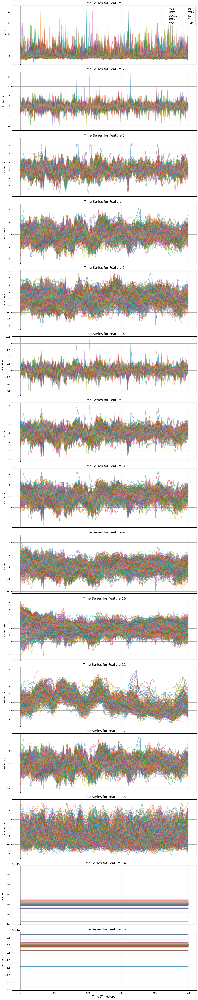

In [ ]:
feature_names = [f"Feature {i+1}" for i in range(X.shape[2])]

# Plot settings
num_features = X.shape[2]
num_timesteps = X.shape[1]
num_companies = X.shape[0]

fig, axes = plt.subplots(nrows=num_features, ncols=1, figsize=(12, 4 * num_features), sharex=True)

# If there's only one feature, make axes iterable
if num_features == 1:
    axes = [axes]

for feature_idx, ax in enumerate(axes):
    ax.set_title(f"Time Series for {feature_names[feature_idx]}", fontsize=14)
    ax.set_ylabel(feature_names[feature_idx])

    # Plot each company's time series for this feature
    for company_idx in range(num_companies):
        ax.plot(
            range(num_timesteps),
            X[company_idx, :, feature_idx],
            label=company_names[company_idx] if feature_idx == 0 else "",
            alpha=0.5  # Add transparency for better overlap visualization
        )

    ax.grid(True)

# Add legend for the first subplot
axes[0].legend(
    company_names[:10],  # Limit the number of legend entries for clarity
    loc='upper right',
    fontsize=10,
    ncol=2
)

plt.xlabel("Time (Timesteps)", fontsize=12)
plt.tight_layout()
plt.show()

## Plotting data

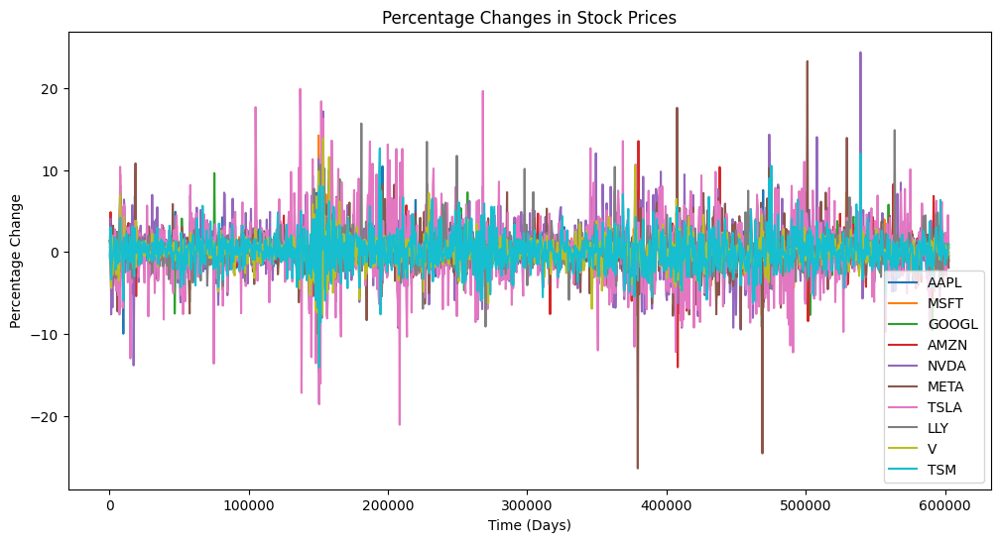

In [ ]:
selected_companies = list(company_dfs.keys())[:10]

plt.figure(figsize=(12, 6))
for company in selected_companies:
    df = company_dfs[company]
    plt.plot(df['Percentage Change'], label=company)
plt.title("Percentage Changes in Stock Prices")
plt.xlabel("Time (Days)")
plt.ylabel("Percentage Change")
plt.legend()
plt.show()

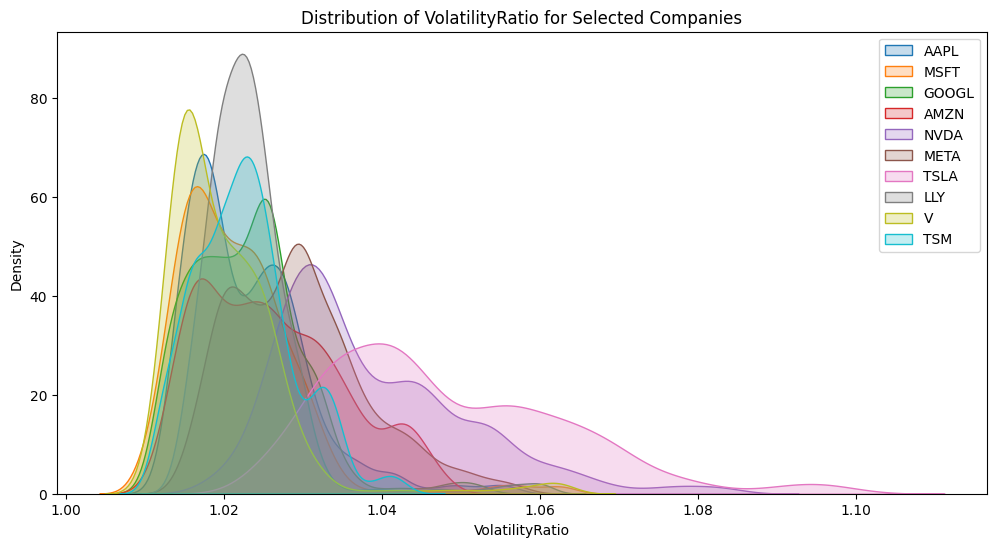

In [ ]:
feature_to_plot = 'VolatilityRatio'  # change feature
plt.figure(figsize=(12, 6))
for company in selected_companies:
    sns.kdeplot(company_dfs[company][feature_to_plot].dropna(), label=company, fill=True)
plt.title(f"Distribution of {feature_to_plot} for Selected Companies")
plt.xlabel(feature_to_plot)
plt.ylabel("Density")
plt.legend()
plt.show()

# K-means

In [ ]:
wcss = []
k_range = range(2,11)
# Loop through each k value
for k in k_range:
    model = TimeSeriesKMeans(n_clusters=k, metric="dtw", verbose=True, random_state=42)
    model.fit(X)
    wcss.append(model.inertia_)  # Sum of squared distances to centroids

# Plot the Elbow graph
plt.figure(figsize=(8, 6))
plt.plot(k_range, wcss, marker='o')
plt.title("Elbow Method for Optimal k")
plt.xlabel("Number of clusters (k)")
plt.ylabel("WCSS (Within-Cluster Sum of Squares)")
plt.show()

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    1.9s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    2.5s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    3.6s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    2.0s
[Parallel(n_jobs=1)]: Done 799 tasks      | elapsed:    4.5s
[Parallel(n_jobs=1)]: Done 1249 tasks      | elapsed:    6.8s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    1.9s
[Parallel(n_jobs=1)]: Done 799 tasks      | elapsed:    5.6s
[Parallel(n_jobs=1)]: Done 1249 tasks      | elapsed:    7.5s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    1.4s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    3.2s
[Parallel(n_jobs=1)]: 

4311.501 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done 799 tasks      | elapsed:    4.0s
[Parallel(n_jobs=1)]: Done 1249 tasks      | elapsed:    7.1s


2367.143 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done 799 tasks      | elapsed:    3.1s
[Parallel(n_jobs=1)]: Done 1249 tasks      | elapsed:    5.7s


2346.395 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done 799 tasks      | elapsed:    3.1s
[Parallel(n_jobs=1)]: Done 1249 tasks      | elapsed:    4.9s


2338.485 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done 799 tasks      | elapsed:    3.1s
[Parallel(n_jobs=1)]: Done 1249 tasks      | elapsed:    4.9s


2335.622 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done 799 tasks      | elapsed:    3.1s
[Parallel(n_jobs=1)]: Done 1249 tasks      | elapsed:    4.9s


2335.524 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done 799 tasks      | elapsed:    3.1s
[Parallel(n_jobs=1)]: Done 1249 tasks      | elapsed:    4.9s


2335.524 --> 


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done 799 tasks      | elapsed:    3.1s
[Parallel(n_jobs=1)]: Done 1249 tasks      | elapsed:    4.8s


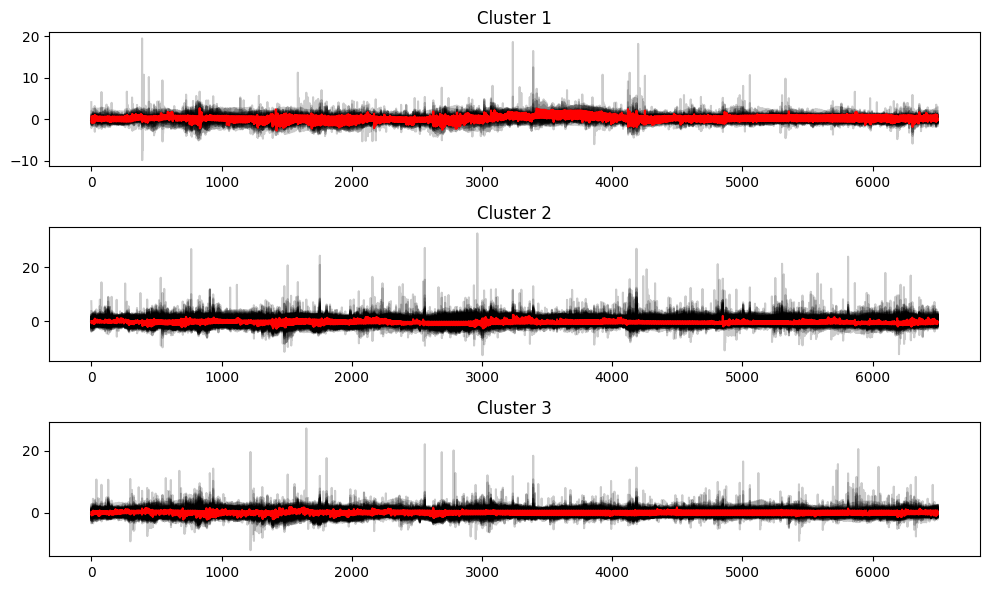

In [ ]:

# Step 2: Apply DTW-based K-means clustering
# Choose the number of clusters based on your use case; for example, k=3
n_clusters = 3
model = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw", verbose=True, random_state=42)
labels = model.fit_predict(X)

# Step 3: Visualize the clusters
plt.figure(figsize=(10, 6))
for yi in range(n_clusters):
    plt.subplot(3, 1, yi + 1)
    for xx in X[labels == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(model.cluster_centers_[yi].ravel(), "r-")
    plt.title(f"Cluster {yi+1}")
plt.tight_layout()
plt.show()


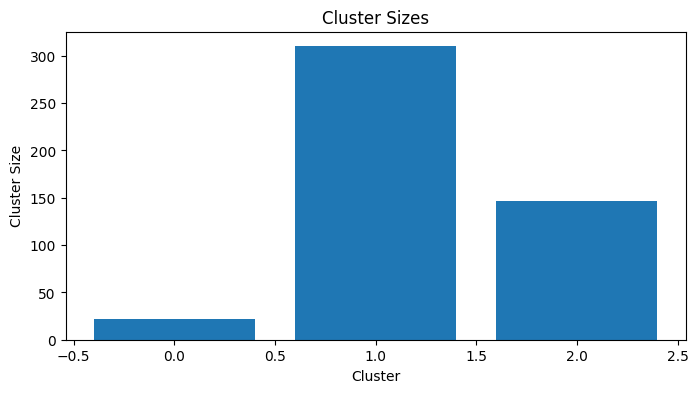

In [ ]:
plt.figure(figsize=(8, 4))
plt.bar(range(n_clusters), [np.sum(labels == i) for i in range(n_clusters)])
plt.xlabel("Cluster")
plt.ylabel("Cluster Size")
plt.title("Cluster Sizes")
plt.show()

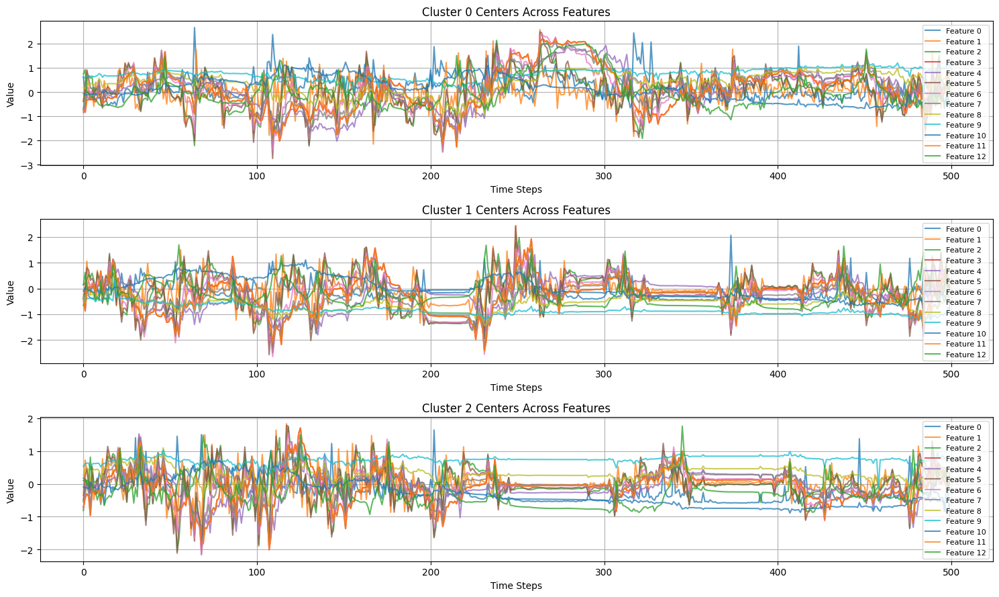

In [ ]:
cluster_centers = model.cluster_centers_
cluster_centers = np.transpose(cluster_centers, (0, 2, 1))

# Number of clusters and features
n_clusters = cluster_centers.shape[0]
n_features = cluster_centers.shape[1]

# Plot each cluster center
plt.figure(figsize=(15, n_clusters * 3))

for cluster_idx in range(n_clusters):
    plt.subplot(n_clusters, 1, cluster_idx + 1)

    for feature_idx in range(n_features):
        plt.plot(
            cluster_centers[cluster_idx][feature_idx],
            label=f"Feature {feature_idx}",
            alpha=0.75
        )

    plt.title(f"Cluster {cluster_idx} Centers Across Features")
    plt.xlabel("Time Steps")
    plt.ylabel("Value")
    plt.legend(loc='upper right', fontsize=8)
    plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
cluster_index = 2  # For the third cluster (Cluster 3)
companies_in_third_cluster = company_names[labels == cluster_index]

# Display companies in the third cluster
print("Companies in Cluster 3:")
for company in companies_in_third_cluster:
    print(company)


Companies in Cluster 3:
AAPL
TSM
UNH
XOM
CVX
SHEL
NFLX
AMD
LIN
AZN
TMUS
DIS
BHP
HDB
PM
COP
GE
MS
BUD
RY
SBUX
LMT
GS
ELV
BP
EQNR
CB
PANW
C
MELI
IBN
DEO
SLB
MO
ENB
RELX
EOG
CNQ
BTI
HCA
STLA
SAN
ITUB
HUM
MCK
CMG
MAR
BN
BMO
EPD
CTAS
DELL
PXD
MSI
AJG
OXY
TDG
BNS
APO
ING
CPRT
BSBR
ADSK
ET
AZO
AIG
HES
WMB
CRH
DXCM
PCG
STZ
KHC
ABEV
LNG
HLT
SU
DHI
EW
FTNT
TRV
SGEN
COR
ADM
OKE
EA
MPLX
SYY
CM
LEN
LHX
BCE
BBD
LYG
CSGP
IT
ARES
BKR
HAL
IMO
KR
QSR
VICI
GOLD
CQP
DVN
MLM
ELP
VMC
IR
VEEV
FANG
CCEP
BCS
TTWO
DLTR
CAH
TLK
NWG
WY
WPM
VRSN
BRO
ULTA
HEI
UMC
TS
NOK
TRGP
NVR
ROL
PPL
CCJ
LYV
PDX
DOW
ALC
UBER
CTVA
DDOG
BNTX
OTIS
LI
BEKE
SNOW
DASH
ABNB


In [ ]:
distorsions = []
for k in range(2, 20):
    k_means = KMeans(n_clusters=k)
    k_means.fit(X_filled)
    distorsions.append(k_means.inertia_)
fig = plt.figure(figsize=(15, 5))

plt.plot(range(2, 20), distorsions)
plt.grid(True)
plt.title('Elbow curve')

ValueError: Found array with dim 3. KMeans expected <= 2.

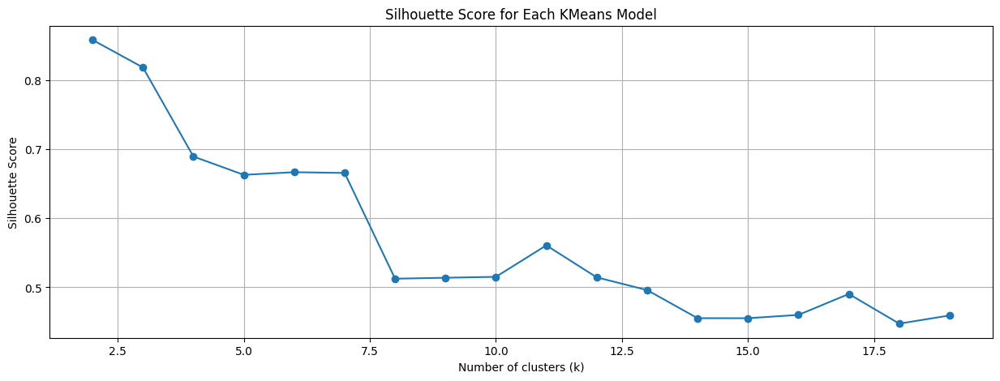

In [ ]:
from sklearn.metrics import silhouette_score

sil_scores = []

# Iterate through a range of k values
for k in range(2, 20):
    k_means = KMeans(n_clusters=k)
    k_means.fit(X_filled)

    # Calculate the silhouette score for each model
    sil_score = silhouette_score(X_filled, k_means.labels_)
    sil_scores.append(sil_score)

# Plot silhouette scores for each k value
fig = plt.figure(figsize=(15, 5))
plt.plot(range(2, 20), sil_scores, marker='o')
plt.title('Silhouette Score for Each KMeans Model')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

# DBSCAN

## Hyperparameter Tuning

In [ ]:
# Compute pairwise distance matrix using DTW
distance_matrix = cdist_dtw(X)

# Define the optimization objective function
def objective(trial):
    eps = trial.suggest_float("eps", 50, 70)  # Search range for eps
    min_samples = trial.suggest_int("min_samples", 10, 50)  # Search range for min_samples

    # Initialize DBSCAN with trial parameters
    model = DBSCAN(eps=eps, min_samples=min_samples, metric="precomputed")
    labels = model.fit_predict(distance_matrix)

    # Avoid cases where all points are noise
    if len(set(labels)) <= 1:
        return -1  # Penalize configurations with no clusters

    # Evaluate clustering performance
    score = silhouette_score(distance_matrix, labels, metric="precomputed")
    return score

# Optimize
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=50)

# Best parameters and score
print("Best Params:", study.best_params)
print("Best Score:", study.best_value)

[I 2024-12-09 19:04:38,508] A new study created in memory with name: no-name-bf9da41e-e054-4cf1-9f08-08844683cfc6
[I 2024-12-09 19:04:38,529] Trial 0 finished with value: 0.0004246550161866584 and parameters: {'eps': 60.62946133904504, 'min_samples': 45}. Best is trial 0 with value: 0.0004246550161866584.
[I 2024-12-09 19:04:38,538] Trial 1 finished with value: -1.0 and parameters: {'eps': 58.95989949245785, 'min_samples': 48}. Best is trial 0 with value: 0.0004246550161866584.
[I 2024-12-09 19:04:38,553] Trial 2 finished with value: -0.0026982994412271064 and parameters: {'eps': 59.34020350793482, 'min_samples': 37}. Best is trial 0 with value: 0.0004246550161866584.
[I 2024-12-09 19:04:38,569] Trial 3 finished with value: 0.07678834862544034 and parameters: {'eps': 69.77952204078152, 'min_samples': 19}. Best is trial 3 with value: 0.07678834862544034.
[I 2024-12-09 19:04:38,584] Trial 4 finished with value: 0.08278910025382333 and parameters: {'eps': 69.5173521922903, 'min_samples': 

Best Params: {'eps': 69.5173521922903, 'min_samples': 13}
Best Score: 0.08278910025382333


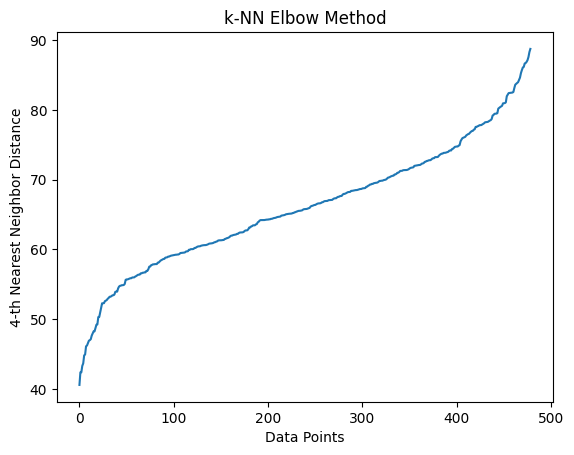

In [ ]:
X_flattened = X.reshape(X.shape[0], -1)

k = 4
knn = NearestNeighbors(n_neighbors=k)
knn.fit(X_flattened)

# distances to the k-th nearest neighbor
distances, indices = knn.kneighbors(X_flattened)

distances = np.sort(distances[:, -1], axis=0)
plt.plot(distances)
plt.title("k-NN Elbow Method")
plt.xlabel("Data Points")
plt.ylabel(f"{k}-th Nearest Neighbor Distance")
plt.show()

## Clustering

In [ ]:
scaler = TimeSeriesScalerMeanVariance()
X_scaled = scaler.fit_transform(X)

# Compute pairwise distance matrix using DTW
distance_matrix = cdist_dtw(X_scaled)

In [ ]:
# Fit DBSCAN with the distance matrix
dbscan = DBSCAN(eps=60, min_samples=20, metric='precomputed')
labels = dbscan.fit_predict(distance_matrix)

# Add cluster labels to companies
company_labels = pd.DataFrame({'Company': company_names, 'Cluster': labels})

print(company_labels)

    Company  Cluster
0      AAPL        0
1      MSFT        0
2     GOOGL        0
3      AMZN        0
4      NVDA        0
..      ...      ...
474    BEKE       -1
475    SNOW       -1
476    PLTR       -1
477    DASH       -1
478    ABNB       -1

[479 rows x 2 columns]


In [ ]:
from sklearn.metrics import pairwise_distances

# Flatten the data into 2D
X_flattened = X.reshape(X.shape[0], -1)

# standardize data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_flattened)

# # Calculate pairwise distances using Euclidean distance
# distances = pairwise_distances(X_scaled, metric='euclidean')

In [ ]:
pca = PCA(n_components=5)
X_reduced = pca.fit_transform(X_scaled)

# Apply DBSCAN
dbscan = DBSCAN(eps=29, min_samples=47)
labels = dbscan.fit_predict(X_reduced)

# Print cluster labels
print("Cluster labels:", labels)

Cluster labels: [ 0  0  0  0  0 -1  0 -1  0  0 -1  0  0  0 -1 -1  0 -1  0  0  0  0  0 -1
  0  0 -1 -1 -1  0 -1  0  0 -1  0 -1  0  0  0 -1 -1 -1  0 -1  0  0  0  0
 -1  0  0  0  0  0  0 -1  0  0 -1  0  0 -1  0  0 -1  0  0  0 -1  0  0  0
  0  0  0  0  0  0 -1  0  0 -1 -1 -1 -1 -1  0  0 -1  0  0  0 -1  0 -1  0
  0  0  0  0  0 -1 -1 -1  0 -1 -1  0  0  0 -1  0  0 -1 -1 -1 -1  0 -1 -1
  0  0 -1  0  0  0  0  0 -1  0  0  0  0  0  0  0 -1  0  0  0 -1 -1  0 -1
  0  0  0  0  0 -1 -1 -1  0 -1 -1 -1  0  0 -1 -1 -1  0  0  0  0 -1  0  0
 -1 -1 -1  0  0  0  0  0 -1 -1 -1  0  0  0  0  0  0  0 -1  0 -1 -1  0  0
  0 -1  0 -1 -1  0 -1  0  0  0  0 -1  0  0  0  0  0  0 -1  0  0  0  0  0
  0  0  0  0  0  0 -1  0 -1  0 -1  0 -1  0  0  0  0  0 -1  0 -1  0  0 -1
  0  0  0  0  0 -1 -1 -1  0 -1 -1  0  0 -1  0  0 -1  0 -1  0 -1  0 -1 -1
  0  0  0 -1  0 -1  0  0 -1  0 -1  0  0  0 -1 -1 -1 -1 -1  0 -1  0  0  0
 -1 -1  0  0  0  0 -1 -1  0 -1  0  0  0  0  0  0  0  0  0 -1  0  0 -1  0
  0  0  0  0 -1 -1 -1 -1 -1  0 -1 -

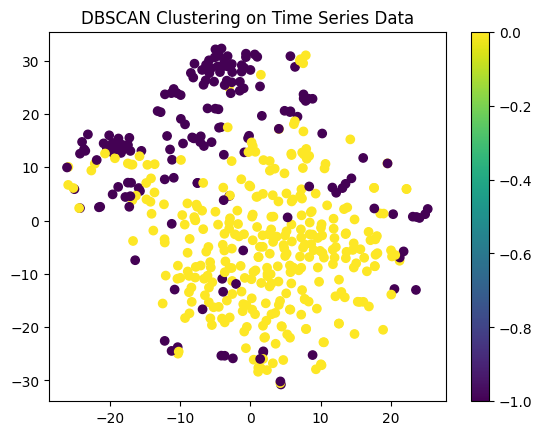

In [ ]:
# # Use PCA for dimensionality reduction to 2D for visualization purposes
# pca = PCA(n_components=2)
# X_pca = pca.fit_transform(X_scaled)

tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

# Plot the clusters
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels, cmap='viridis')
plt.colorbar()  # Show color bar to indicate cluster labels
plt.title("DBSCAN Clustering on Time Series Data")
plt.show()

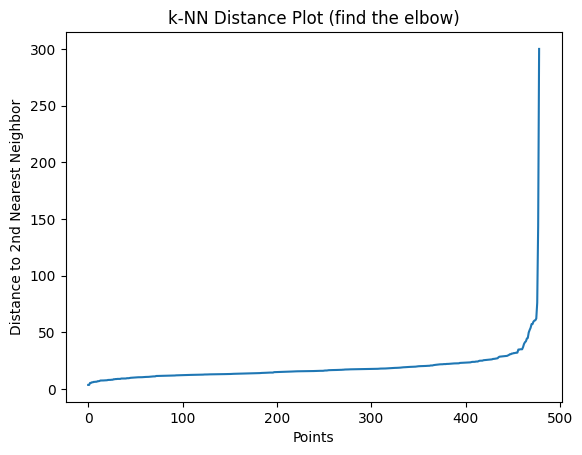

In [ ]:
# Calculate k-nearest neighbors distances
neighbors = NearestNeighbors(n_neighbors=2)
neighbors_fit = neighbors.fit(X_reduced)
distances, indices = neighbors_fit.kneighbors(X_reduced)

# Sort the distances
distances = np.sort(distances[:, 1], axis=0)

# Plot the distances to visualize the knee
plt.plot(distances)
plt.xlabel('Points')
plt.ylabel('Distance to 2nd Nearest Neighbor')
plt.title('k-NN Distance Plot (find the elbow)')
plt.show()

# Autoencoder

In [ ]:
company_time_series_data = {}

for company, df in company_dfs.items():
    # Specify the columns to drop if they exist in the dataframe
    columns_to_drop = ['Date', 'Open', 'High', 'Low', 'Close',
                       'Dividends', 'Stock Splits', 'Company']

    # Drop only the columns that are present in the dataframe
    filtered_df = df.drop(columns=[col for col in columns_to_drop if col in df.columns])
    scaler = StandardScaler()
    filtered_df = pd.DataFrame(scaler.fit_transform(filtered_df), columns=filtered_df.columns)
    company_series = filtered_df.iloc[-500:].values

    if not np.isnan(company_series).any():  # If no NaN values
        #Convert to time series dataset format and store
        company_time_series_data[company] = to_time_series_dataset([company_series])

for company, time_series in company_time_series_data.items():
    print(f"{company}: shape {time_series.shape}")

AAPL: shape (1, 500, 13)
MSFT: shape (1, 500, 13)
GOOGL: shape (1, 500, 13)
AMZN: shape (1, 500, 13)
NVDA: shape (1, 500, 13)
META: shape (1, 500, 13)
TSLA: shape (1, 500, 13)
LLY: shape (1, 500, 13)
V: shape (1, 500, 13)
TSM: shape (1, 500, 13)
UNH: shape (1, 500, 13)
AVGO: shape (1, 500, 13)
NVO: shape (1, 500, 13)
JPM: shape (1, 500, 13)
WMT: shape (1, 500, 13)
XOM: shape (1, 500, 13)
MA: shape (1, 500, 13)
JNJ: shape (1, 500, 13)
PG: shape (1, 500, 13)
ORCL: shape (1, 500, 13)
HD: shape (1, 500, 13)
ADBE: shape (1, 500, 13)
ASML: shape (1, 500, 13)
CVX: shape (1, 500, 13)
COST: shape (1, 500, 13)
TM: shape (1, 500, 13)
MRK: shape (1, 500, 13)
KO: shape (1, 500, 13)
ABBV: shape (1, 500, 13)
BAC: shape (1, 500, 13)
PEP: shape (1, 500, 13)
FMX: shape (1, 500, 13)
CRM: shape (1, 500, 13)
SHEL: shape (1, 500, 13)
ACN: shape (1, 500, 13)
NFLX: shape (1, 500, 13)
MCD: shape (1, 500, 13)
AMD: shape (1, 500, 13)
LIN: shape (1, 500, 13)
NVS: shape (1, 500, 13)
AZN: shape (1, 500, 13)
CSCO: s

In [ ]:
X = np.array([np.array(series) for series in company_time_series_data.values()])
company_names = np.array(list(company_time_series_data.keys()))
X = np.nan_to_num(X, nan=np.nanmean(X), posinf=np.nanmean(X), neginf=np.nanmean(X))
X = np.squeeze(X)
print(X.shape)

(479, 500, 13)


In [ ]:
# Reshape data for LSTM (samples, time steps, features)
n_samples, time_steps, n_features = X.shape

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X.reshape(-1, n_features)).reshape(n_samples, time_steps, n_features)

# Train-test split
X_train, X_val = train_test_split(X_scaled, test_size=0.2, random_state=42)

In [ ]:
from tensorflow.keras.optimizers import Adam

# LSTM Autoencoder model
encoding_dim = 4  # Dimensionality of the encoding layer

# Define the LSTM Autoencoder model
input_layer = layers.Input(shape=(time_steps, n_features))
encoded = layers.LSTM(encoding_dim, activation='relu', return_sequences=False)(input_layer)
decoded = layers.RepeatVector(time_steps)(encoded)
decoded = layers.LSTM(n_features, activation='sigmoid', return_sequences=True)(decoded)

autoencoder = models.Model(input_layer, decoded)

# Define the encoder (for extracting features later)
encoder = models.Model(input_layer, encoded)

# Define the optimizer with gradient clipping
optimizer = Adam(learning_rate=1e-2, clipvalue=1.0)

# Compile the model
autoencoder.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
history = autoencoder.fit(X_train, X_train, epochs=50, batch_size=256, shuffle=True, validation_data=(X_val, X_val))

Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 887ms/step - loss: 1.1701 - val_loss: 1.0578
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 760ms/step - loss: 1.1455 - val_loss: 1.0214
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 761ms/step - loss: 1.1134 - val_loss: 1.0026
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step - loss: 1.0953 - val_loss: 0.9895
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 447ms/step - loss: 1.0778 - val_loss: 0.9799
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step - loss: 1.0674 - val_loss: 0.9722
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 464ms/step - loss: 1.0357 - val_loss: 0.9632
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 462ms/step - loss: 1.0541 - val_loss: 0.9558
Epoch 9/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step - loss: 1.0479 - val_loss: 0.9531
Epoch 10/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 465ms/step - loss: 1.0351 - val_loss: 0.9460
Epoch 11/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 445ms/step - loss: 1.0077 - val_loss: 0.9412
Epoch 12/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 461ms/step - loss: 1.0202 - val_lo

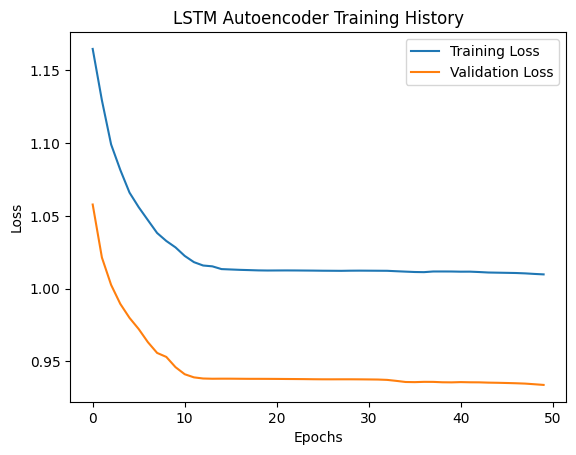

In [ ]:
# Plot the training history
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('LSTM Autoencoder Training History')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Extract features using the encoder
encoded_features = encoder.predict(X_train)

# Apply K-Means clustering on the encoded features
n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(encoded_features)

# Get the cluster labels
cluster_labels = kmeans.labels_

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


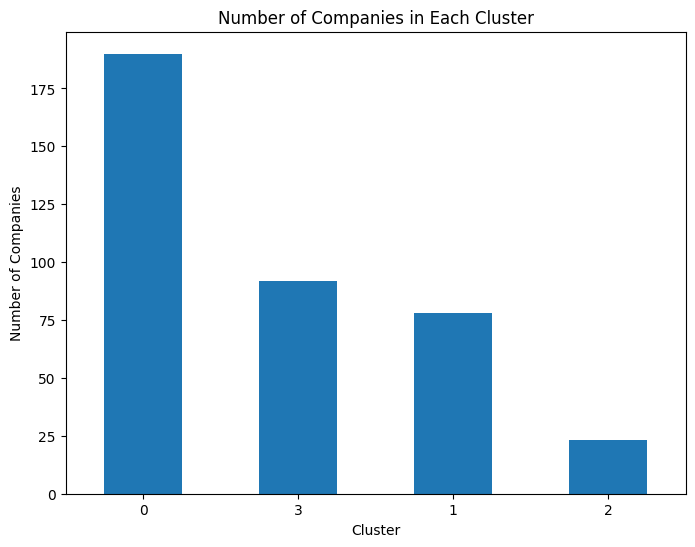

In [ ]:
# Create a DataFrame to associate companies with their cluster labels
df = pd.DataFrame({
    'Company': company,
    'Cluster': kmeans.labels_
})

# Count how many companies are in each cluster
cluster_counts = df['Cluster'].value_counts()

# Plot the counts of companies per cluster
plt.figure(figsize=(8, 6))
cluster_counts.plot(kind='bar')
plt.title('Number of Companies in Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of Companies')
plt.xticks(rotation=0)
plt.show()

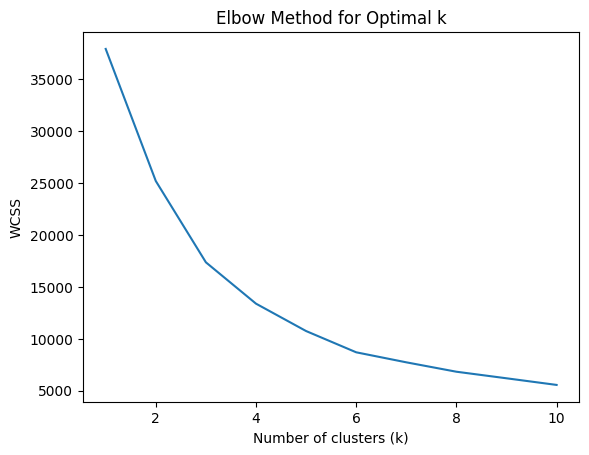

In [ ]:
wcss = []
for k in range(1, 11):  # Try k from 1 to 10
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=42)
    kmeans.fit(encoded_features)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of clusters (k)')
plt.ylabel('WCSS')
plt.show()

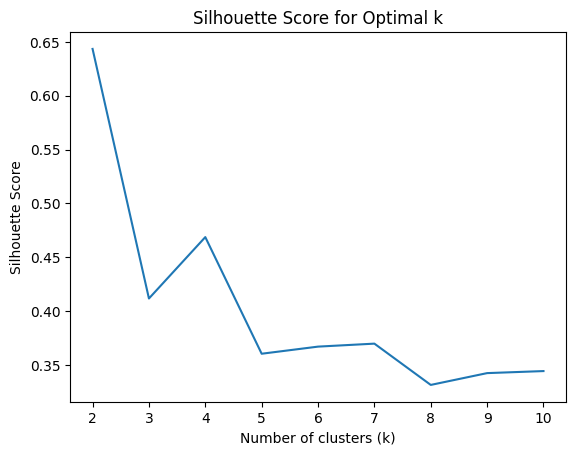

In [ ]:
silhouette_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=42)
    kmeans.fit(encoded_features)
    score = silhouette_score(encoded_features, kmeans.labels_)
    silhouette_scores.append(score)

plt.plot(range(2, 11), silhouette_scores)
plt.title('Silhouette Score for Optimal k')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.show()

In [ ]:
centroids = kmeans.cluster_centers_
print("Cluster Centroids in Encoded Feature Space:")
print(centroids)

Cluster Centroids in Encoded Feature Space:
[[ 0.25970435 10.834606    2.2712457  10.758307  ]
 [ 1.9963579   8.249365    1.0921277   1.1285567 ]
 [ 8.6607685  33.853573    0.76717055  2.673461  ]
 [ 0.2910235  17.159618    3.8005142  11.833767  ]]


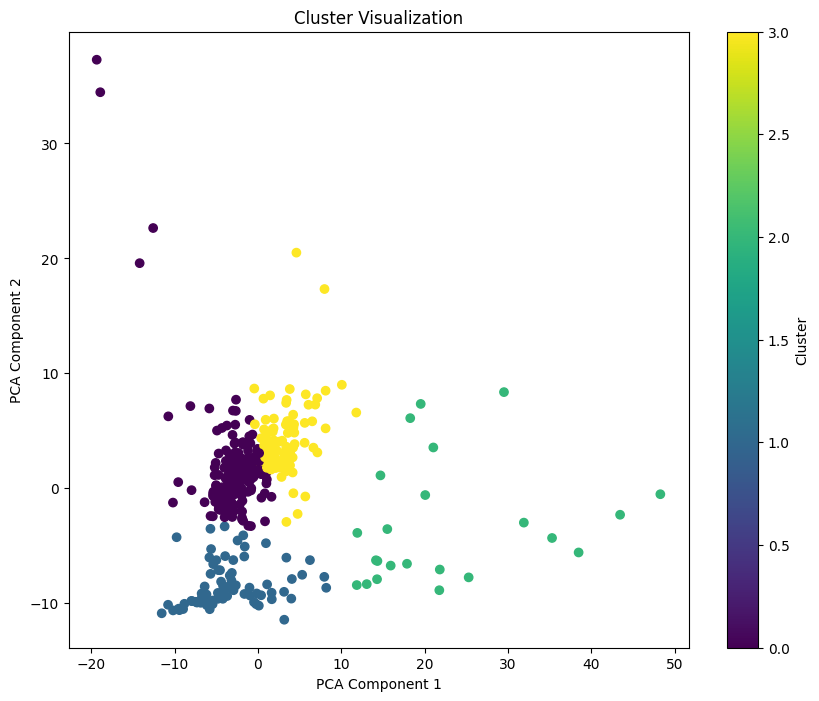

In [ ]:
# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
pca_result = pca.fit_transform(encoded_features)

# Visualize the clusters
plt.figure(figsize=(10, 8))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=kmeans.labels_, cmap='viridis')
plt.title("Cluster Visualization")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.colorbar(label='Cluster')
plt.show()

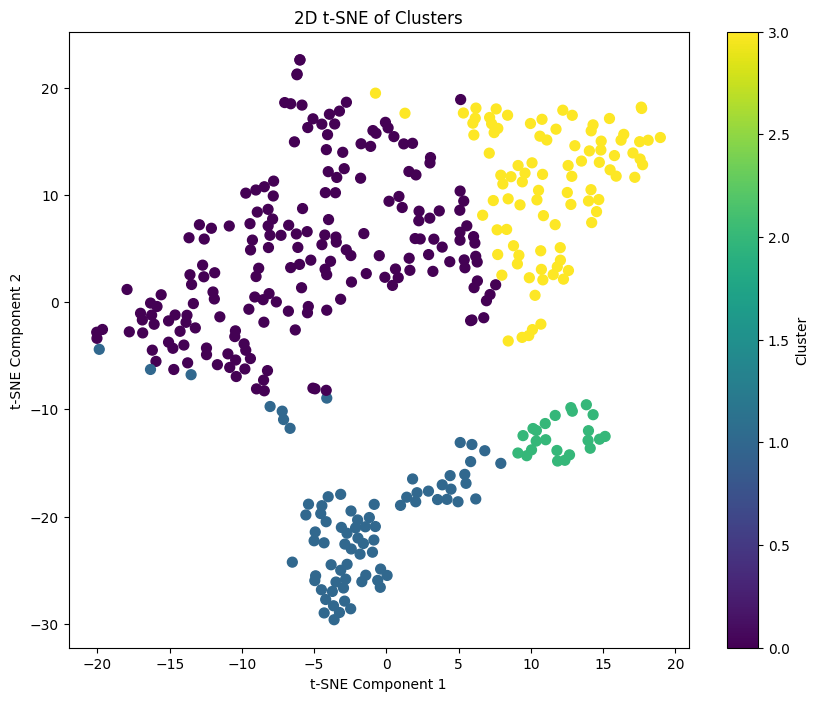

In [ ]:
# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(encoded_features)

# Plot the clusters in 2D
plt.figure(figsize=(10, 8))
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=kmeans.labels_, cmap='viridis', s=50)
plt.title("2D t-SNE of Clusters")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.colorbar(label='Cluster')
plt.show()

# Heirarchical Clustering Algorithm

In [ ]:
# preprocessing the data properly
import numpy as np
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

print(X.shape)

reduced_HCA_X = np.mean(X, axis=1)

# Initialize PCA with 5 components
pca = PCA(n_components=6)

# Fit and transform the data
reduced_HCA_X = pca.fit_transform(reduced_HCA_X)

print(reduced_HCA_X.shape)


(479, 500, 15)
(479, 6)


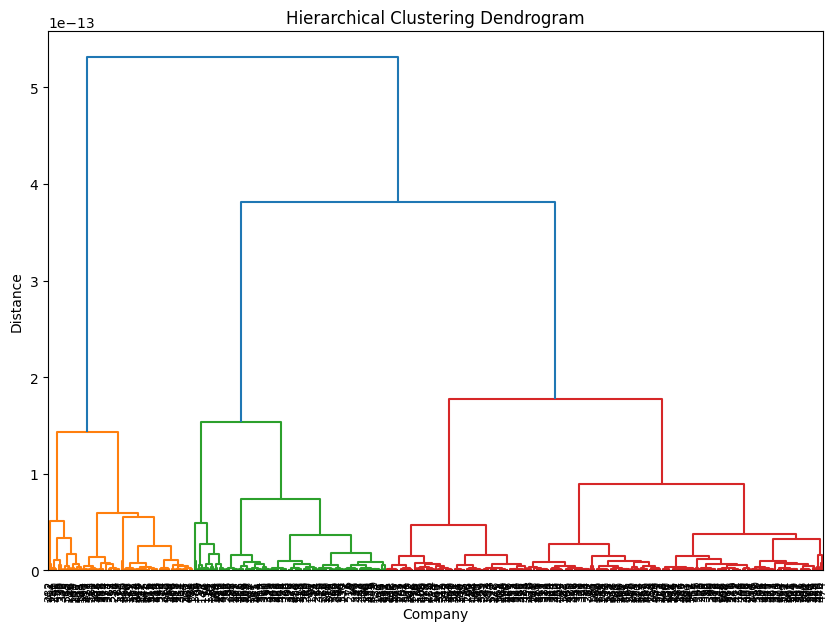

In [ ]:

# Step 2: Perform hierarchical clustering
# Calculate the linkage matrix using a chosen method (e.g., 'ward')
linkage_matrix = linkage(reduced_HCA_X, method='ward')

# Step 3: Plot the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(linkage_matrix, leaf_rotation=90., leaf_font_size=8.)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Company')
plt.ylabel('Distance')
plt.show()

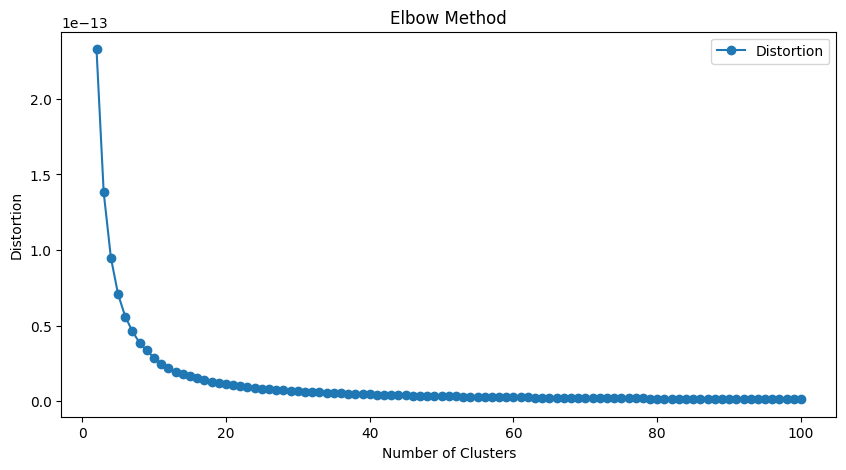

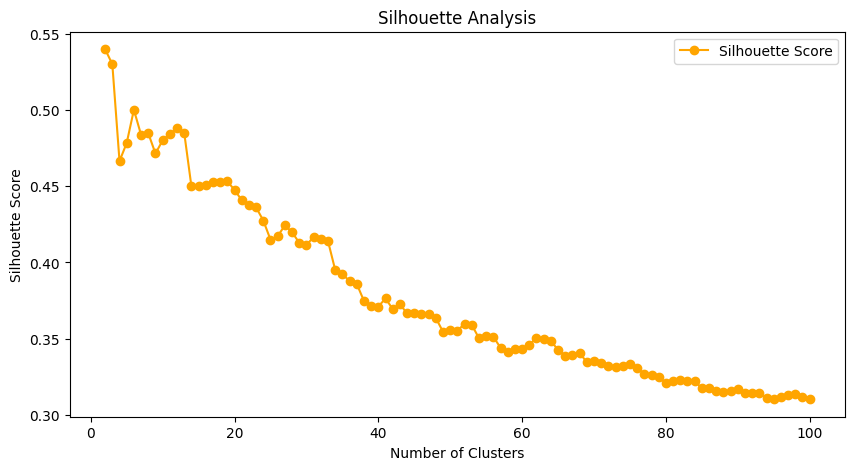

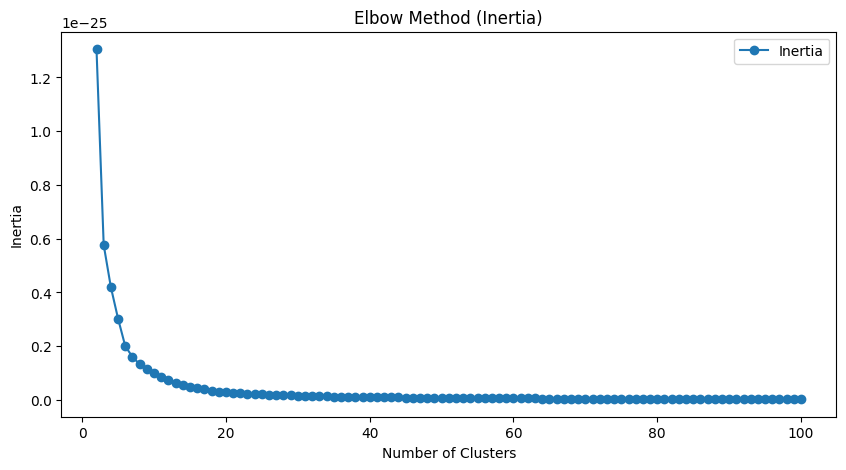

Silhouette Score for 14 clusters: 0.4499806442336073
+-------+-------------+-------------+-------------+-------------+-------------+-------------+-------------+-------------+-------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--

In [ ]:
from scipy.cluster.hierarchy import fcluster
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# Function to evaluate optimal number of clusters
def evaluate_clusters(linkage_matrix, data, max_clusters=50):
    distortions = []
    silhouette_scores = []

    for k in range(2, max_clusters + 1):  # Start from 2 clusters
        # Cut the dendrogram to form k clusters
        cluster_labels = fcluster(linkage_matrix, k, criterion='maxclust')

        # Compute distortion (within-cluster variance)
        distortions.append(np.mean([np.linalg.norm(data[cluster_labels == i] - np.mean(data[cluster_labels == i], axis=0))
                                    for i in range(1, k+1)]))

        # Compute silhouette score
        silhouette_scores.append(silhouette_score(data, cluster_labels))

    return distortions, silhouette_scores

# Evaluate clusters
max_clusters = 100
distortions, silhouette_scores = evaluate_clusters(linkage_matrix, reduced_HCA_X, max_clusters=max_clusters)

# Plot Elbow Method for Distortion
plt.figure(figsize=(10, 5))
plt.plot(range(2, max_clusters + 1), distortions, marker='o', label='Distortion')
plt.xlabel('Number of Clusters')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.legend()
plt.show()

# Plot Silhouette Score
plt.figure(figsize=(10, 5))
plt.plot(range(2, max_clusters + 1), silhouette_scores, marker='o', label='Silhouette Score', color='orange')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis')
plt.legend()
plt.show()

# Function to calculate inertia
def calculate_inertia(data, cluster_labels, n_clusters):
    inertia = 0
    for cluster_id in range(1, n_clusters + 1):  # Cluster IDs start from 1
        cluster_points = data[cluster_labels == cluster_id]
        cluster_center = np.mean(cluster_points, axis=0)
        inertia += np.sum(np.linalg.norm(cluster_points - cluster_center, axis=1) ** 2)
    return inertia

# Evaluate inertia for different cluster numbers
inertias = []
for k in range(2, max_clusters + 1):  # Start from 2 clusters
    # Get cluster labels for k clusters
    cluster_labels = fcluster(linkage_matrix, k, criterion='maxclust')
    # Calculate inertia
    inertia = calculate_inertia(reduced_HCA_X, cluster_labels, n_clusters=k)
    inertias.append(inertia)

# Plot the inertia (Elbow Method)
plt.figure(figsize=(10, 5))
plt.plot(range(2, max_clusters + 1), inertias, marker='o', label='Inertia')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method (Inertia)')
plt.legend()
plt.show()


 # Cut the dendrogram to form k clusters
k_HCA = 14
cluster_labels = fcluster(linkage_matrix, k_HCA, criterion='maxclust')

# Compute distortion (within-cluster variance)
distortion_cluster_HCA_14 = np.mean([np.linalg.norm(reduced_HCA_X[cluster_labels == i] - np.mean(reduced_HCA_X[cluster_labels == i], axis=0))
                            for i in range(1, k_HCA+1)])

# Compute silhouette score
silhouette_score_cluster_HCA_14 = silhouette_score(reduced_HCA_X, cluster_labels)

print(f"Silhouette Score for 14 clusters: {silhouette_score_cluster_HCA_14}")

clusters = {}
for i in range(company_names.shape[0]):
    cluster_id = cluster_labels[i]
    if cluster_id not in clusters:
        clusters[cluster_id] = []
    clusters[cluster_id].append(company_names[i])

from tabulate import tabulate

# Find the maximum length of the lists
max_length = max(len(values) for values in clusters.values())

# Pad shorter lists with placeholders (e.g., "N/A")
for key in clusters:
    clusters[key] += ["N/A"] * (max_length - len(clusters[key]))

# Convert dictionary to table-like format
table = [[key] + values for key, values in clusters.items()]

# Printing the table for clusters
print(tabulate(table, headers=["Key"] + [f"Company {i+1}" for i in range(max_length)], tablefmt="grid"))

 # Cut the dendrogram to form k clusters
k_HCA = 100
cluster_labels = fcluster(linkage_matrix, k_HCA, criterion='maxclust')

# Compute distortion (within-cluster variance)
distortion_cluster_HCA_100 = np.mean([np.linalg.norm(reduced_HCA_X[cluster_labels == i] - np.mean(reduced_HCA_X[cluster_labels == i], axis=0))
                            for i in range(1, k_HCA+1)])

# Compute silhouette score
silhouette_score_cluster_HCA_100 = silhouette_score(reduced_HCA_X, cluster_labels)

clusters = {}
for i in range(company_names.shape[0]):
    cluster_id = cluster_labels[i]
    if cluster_id not in clusters:
        clusters[cluster_id] = []
    clusters[cluster_id].append(company_names[i])



In [ ]:
from tabulate import tabulate

# Find the maximum length of the lists
max_length = max(len(values) for values in clusters.values())

# Pad shorter lists with placeholders (e.g., "N/A")
for key in clusters:
    clusters[key] += ["N/A"] * (max_length - len(clusters[key]))

# Convert dictionary to table-like format
table = [[key] + values for key, values in clusters.items()]

# Printing Silhouette Score
print("The Silhouette Score for 100 clusters is:",silhouette_score_cluster_HCA_100)

# Printing the table for clusters
print(tabulate(table, headers=["Cluster Key"] + [f"Company {i+1}" for i in range(max_length)], tablefmt="grid"))

The Silhouette Score for 100 clusters is: 0.31039354184516205
+---------------+-------------+-------------+-------------+-------------+-------------+-------------+-------------+-------------+-------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+
|   Cluster Key | Company 1   | Company 2   | Company 3   | Company 4   | Company 5   | Company 6   | Company 7   | Company 8   | Company 9   | Company 10   | Company 11   | Company 12   | Company 13   | Company 14   | Company 15   | Company 16   |
+===============+=============+=============+=============+=============+=============+=============+=============+=============+=============+==============+==============+==============+==============+==============+==============+==============+
|            89 | AAPL        | ITW         | HES         | DAL         | RJF         | N/A         | N/A         | N/A         | N/A         | N/A          | N/A          | N/A          | N/